In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy import constants, units
from astropy.coordinates import Angle
from scipy.optimize import curve_fit

In [2]:
rootdir = '/Users/thepoetoftwilight/Documents/CUBS/Data/PG1522+101/MUSE/'

Load in the MUSE FITS file

In [3]:
muse_fits = fits.open(rootdir + 'COMBINED_CUBE_MED_FINAL_vac.fits')

In [4]:
muse_fits.info()

Filename: /Users/thepoetoftwilight/Documents/CUBS/Data/PG1522+101/MUSE/COMBINED_CUBE_MED_FINAL_vac.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1211   ()      
  1  DATA          1 ImageHDU        42   (337, 319, 3682)   float32   
  2  STAT          1 ImageHDU        43   (337, 319, 3682)   float32   


In [5]:
data_hdu = muse_fits[1]
var_hdu = muse_fits[2]

In [6]:
data_hdu.header

XTENSION= 'IMAGE   '           / IMAGE extension                                
BITPIX  =                  -32 / number of bits per data pixel                  
NAXIS   =                    3 / number of data axes                            
NAXIS1  =                  337 / Axis lenght                                    
NAXIS2  =                  319 / Axis lenght                                    
NAXIS3  =                 3682 / Axis lenght                                    
PCOUNT  =                    0 / required keyword; must = 0                     
GCOUNT  =                    1 / required keyword; must = 1                     
EXTNAME = 'DATA    '           / This extension contains data values            
HDUCLASS= 'ESO     '           / class name (ESO format)                        
HDUDOC  = 'DICD    '           / document with class description                
HDUVERS = 'DICD version 6'     / version number (according to spec v2.5.1)      
HDUCLAS1= 'IMAGE   '        

In [7]:
var_hdu.header

XTENSION= 'IMAGE   '           / IMAGE extension                                
BITPIX  =                  -32 / number of bits per data pixel                  
NAXIS   =                    3 / number of data axes                            
NAXIS1  =                  337 / Axis lenght                                    
NAXIS2  =                  319 / Axis lenght                                    
NAXIS3  =                 3682 / Axis lenght                                    
PCOUNT  =                    0 / required keyword; must = 0                     
GCOUNT  =                    1 / required keyword; must = 1                     
EXTNAME = 'STAT    '           / This extension contains data variance          
HDUCLASS= 'ESO     '           / class name (ESO format)                        
HDUDOC  = 'DICD    '           / document with class description                
HDUVERS = 'DICD version 6'     / version number (according to spec v2.5.1)      
HDUCLAS1= 'IMAGE   '        

Extract the MUSE cube as a 3-D array

In [8]:
spec_cube = data_hdu.data.copy()
var_cube = var_hdu.data.copy()

In [9]:
spec_cube.shape, var_cube.shape

((3682, 319, 337), (3682, 319, 337))

Extract the wavelength array

In [10]:
wav_0 = data_hdu.header['CRVAL3']
del_wav = data_hdu.header['CD3_3']

In [11]:
wav_arr = np.arange(wav_0, wav_0 + (spec_cube.shape[0]-1)*del_wav, del_wav)

Extract the RA array

In [12]:
RA_ref_pix = data_hdu.header['CRPIX1']-1
RA_ref_val = data_hdu.header['CRVAL1']
del_RA = data_hdu.header['CD1_1']

In [13]:
RA_0_val = RA_ref_val - del_RA*RA_ref_pix

In [14]:
RA_arr = np.arange(RA_0_val, RA_0_val + spec_cube.shape[2]*del_RA, del_RA)

In [15]:
RA_arr_deg = [Angle(ra, units.degree) for ra in RA_arr]

In [19]:
np.round(RA_arr[109],7)

231.1053679

In [20]:
RA_arr_hms = [ra.hms for ra in RA_arr_deg]

In [21]:
RA_arr_labels = [str(int(ra[0])) + 'h' + str(int(ra[1])) + 'm' + str(np.round(ra[2],2)) + 's' 
                 for ra in RA_arr_hms]

Extract Dec array

In [22]:
Dec_ref_pix = data_hdu.header['CRPIX2']-1
Dec_ref_val = data_hdu.header['CRVAL2']
del_Dec = data_hdu.header['CD2_2']

In [23]:
Dec_0_val = Dec_ref_val - del_Dec*Dec_ref_pix

In [24]:
Dec_arr = np.arange(Dec_0_val, Dec_0_val + spec_cube.shape[1]*del_Dec, del_Dec)

In [25]:
np.round(Dec_arr[248],7)

9.9796469

In [21]:
Dec_arr_deg = [Angle(dec, units.degree) for dec in Dec_arr]

In [22]:
Dec_arr_dms = [dec.dms for dec in Dec_arr_deg]

In [23]:
Dec_arr_labels = [str(int(dec[0])) + 'd' + str(int(dec[1])) + 'm' + str(np.round(dec[2],2)) + 's' 
                 for dec in Dec_arr_dms]

Make the flux map at a fixed wavelength (say the 1819th card)

In [24]:
n = 1415

In [25]:
wav = wav_arr[n]

In [26]:
spec_arr = spec_cube[n, :, :]
var_arr = var_cube[n, :, :]

In [27]:
spec_arr_flat = spec_arr.flatten()
var_arr_flat = var_arr.flatten()
min_flux = np.nanpercentile(spec_arr_flat, 1)
max_flux = np.nanpercentile(spec_arr_flat, 99)

In [28]:
qso_ref_pix_x = 168 
qso_ref_pix_y = 162

r_1 = 0

circ_x_1 = [qso_ref_pix_x + r_1*np.cos(p) for p in np.linspace(0, 2*np.pi, 100)]
circ_y_1 = [qso_ref_pix_y + r_1*np.sin(p) for p in np.linspace(0, 2*np.pi, 100)]

r_2 = 1

circ_x_2 = [qso_ref_pix_x + r_2*np.cos(p) for p in np.linspace(0, 2*np.pi, 100)]
circ_y_2 = [qso_ref_pix_y + r_2*np.sin(p) for p in np.linspace(0, 2*np.pi, 100)]

In [29]:
min_flux, max_flux

(-5.462117147445679, 13.540469932556192)

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/505002943.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/505002943.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels, fontsize=13)


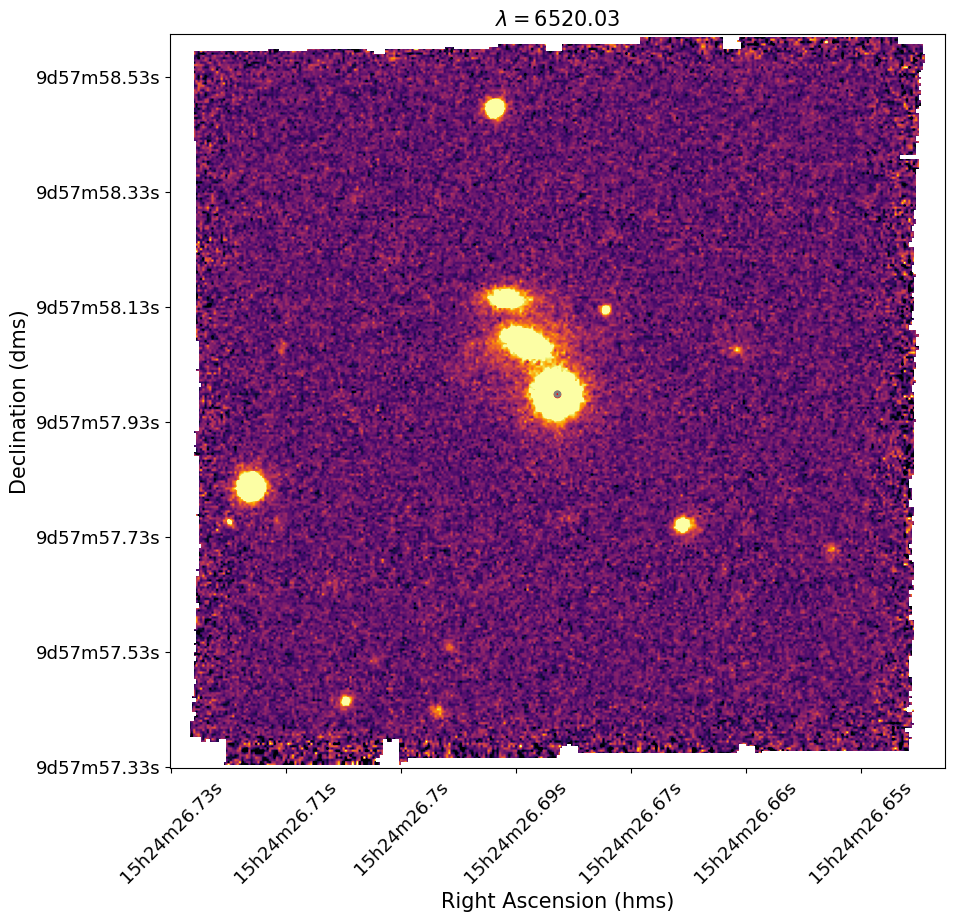

In [30]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.imshow(spec_arr, vmin = min_flux, vmax = max_flux, cmap='inferno')

ax.plot(circ_x_1, circ_y_1, color='gray', lw=2)
ax.plot(circ_x_2, circ_y_2, color='gray', lw=2)

ax.scatter(qso_ref_pix_x, qso_ref_pix_y, color='red', s= 20)

ax.set_title(r'$\lambda = $' + str(np.round(wav, 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels, fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/3964041090.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/3964041090.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels, fontsize=13)


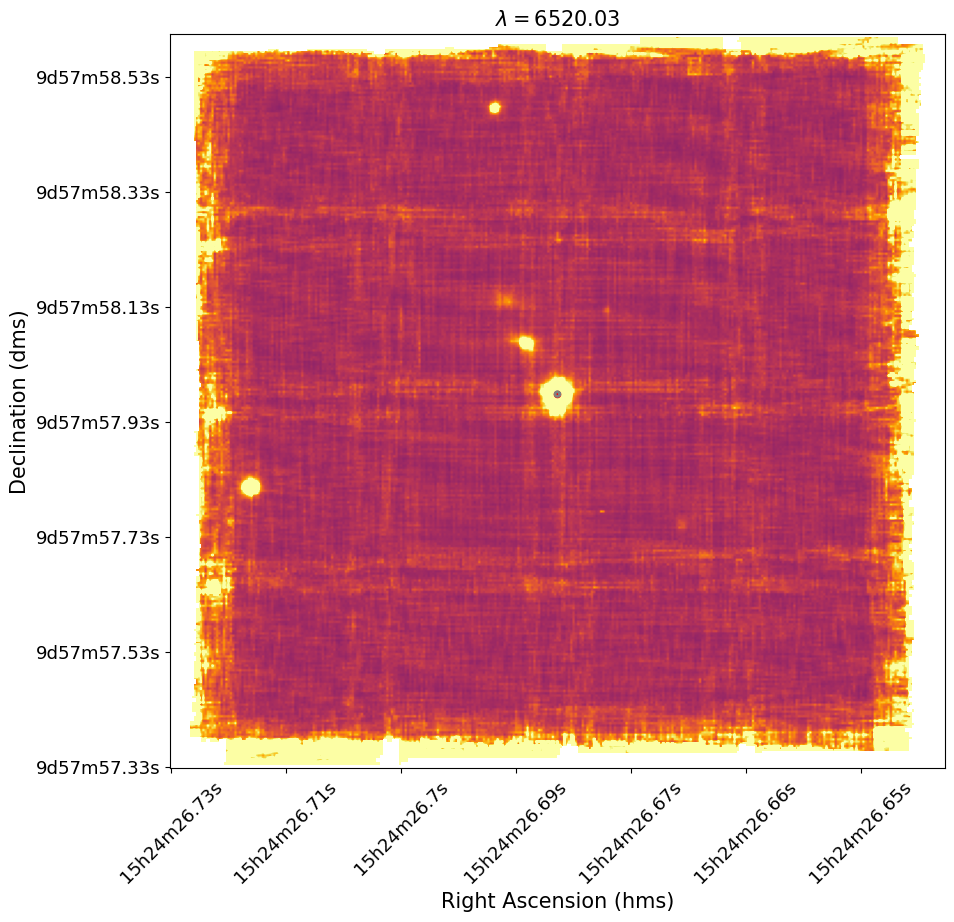

In [31]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.imshow(var_arr, vmin = min_flux, vmax = max_flux, cmap='inferno')

ax.plot(circ_x_1, circ_y_1, color='gray', lw=2)
ax.plot(circ_x_2, circ_y_2, color='gray', lw=2)

ax.scatter(qso_ref_pix_x, qso_ref_pix_y, color='red', s= 20)

ax.set_title(r'$\lambda = $' + str(np.round(wav, 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels, fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

Isolate points within an annulus, and take the median quasar spectrum

In [32]:
pixel_x_arr = []
pixel_y_arr = []

for i in range(spec_cube.shape[2]):
    for j in range(spec_cube.shape[1]):
        
        d = np.sqrt((i-qso_ref_pix_x)**2 + (j-qso_ref_pix_y)**2)
        
        if(d>=r_1 and d<=r_2):
            pixel_x_arr.append(i)
            pixel_y_arr.append(j)

Generate median spectra for these pixels

In [33]:
spec_stack = np.zeros((len(pixel_x_arr), len(wav_arr)))
var_stack = np.zeros((len(pixel_x_arr), len(wav_arr))) 

In [34]:
for i in range(len(pixel_x_arr)):
    
    x = pixel_x_arr[i]
    y = pixel_y_arr[i]
    
    spec_stack[i,:] = spec_cube[:, y, x]
    var_stack[i,:] = var_cube[:, y, x]

In [35]:
spec_master_1 = np.nanmean(spec_stack, axis=0)
err_master_1 = np.sqrt(np.nansum(var_stack, axis=0))/len(pixel_x_arr)

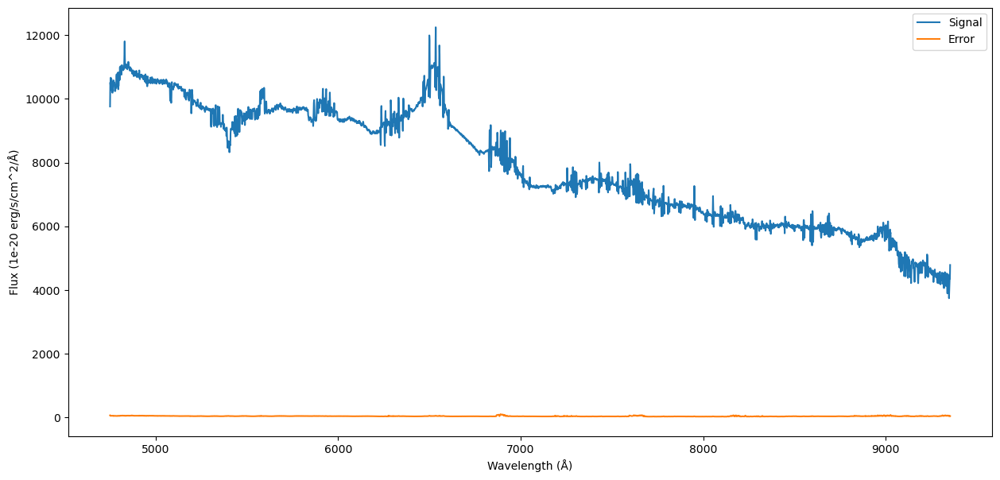

In [36]:
fig, ax = plt.subplots(1, figsize=(15,7))

ax.plot(wav_arr, spec_master_1, label='Signal')
ax.plot(wav_arr, err_master_1, label='Error')

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux (1e-20 erg/s/cm^2/Å)')

ax.legend()

Create another annulus, generate median stack for it as well

In [37]:
r_3 = 10
r_4 = 12

In [38]:
circ_x_3 = [qso_ref_pix_x + r_3*np.cos(p) for p in np.linspace(0, 2*np.pi, 100)]
circ_y_3 = [qso_ref_pix_y + r_3*np.sin(p) for p in np.linspace(0, 2*np.pi, 100)]

circ_x_4 = [qso_ref_pix_x + r_4*np.cos(p) for p in np.linspace(0, 2*np.pi, 100)]
circ_y_4 = [qso_ref_pix_y + r_4*np.sin(p) for p in np.linspace(0, 2*np.pi, 100)]

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/108378127.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/108378127.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels, fontsize=13)


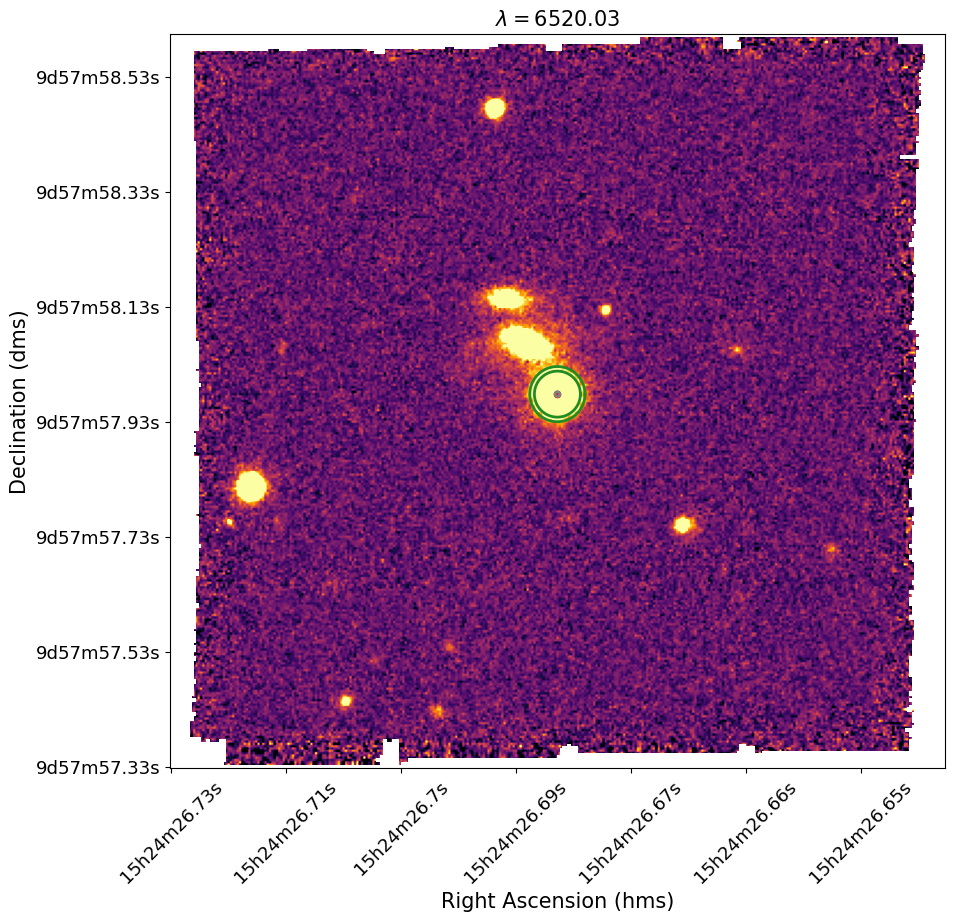

In [39]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.imshow(spec_arr, vmin = min_flux, vmax = max_flux, cmap='inferno')

ax.plot(circ_x_1, circ_y_1, color='gray', lw=2)
ax.plot(circ_x_2, circ_y_2, color='gray', lw=2)

ax.plot(circ_x_3, circ_y_3, color='forestgreen', lw=2)
ax.plot(circ_x_4, circ_y_4, color='forestgreen', lw=2)

ax.scatter(qso_ref_pix_x, qso_ref_pix_y, color='red', s= 20)

ax.set_title(r'$\lambda = $' + str(np.round(wav, 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels, fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

In [40]:
pixel_x_arr_new = []
pixel_y_arr_new = []

for i in range(spec_cube.shape[2]):
    for j in range(spec_cube.shape[1]):
        
        d = np.sqrt((i-qso_ref_pix_x)**2 + (j-qso_ref_pix_y)**2)
        
        if(d>=r_3 and d<=r_4):
            pixel_x_arr_new.append(i)
            pixel_y_arr_new.append(j)

In [41]:
spec_stack_new = np.zeros((len(pixel_x_arr_new), len(wav_arr)))
var_stack_new = np.zeros((len(pixel_x_arr_new), len(wav_arr)))

In [42]:
for i in range(len(pixel_x_arr_new)):
    
    x = pixel_x_arr_new[i]
    y = pixel_y_arr_new[i]
    
    spec_stack_new[i,:] = spec_cube[:, y, x]
    var_stack_new[i,:] = var_cube[:, y, x]

In [43]:
spec_master_2 = np.nanmean(spec_stack_new, axis=0)
err_master_2 = np.sqrt(np.nansum(var_stack_new, axis=0))/len(pixel_x_arr_new)

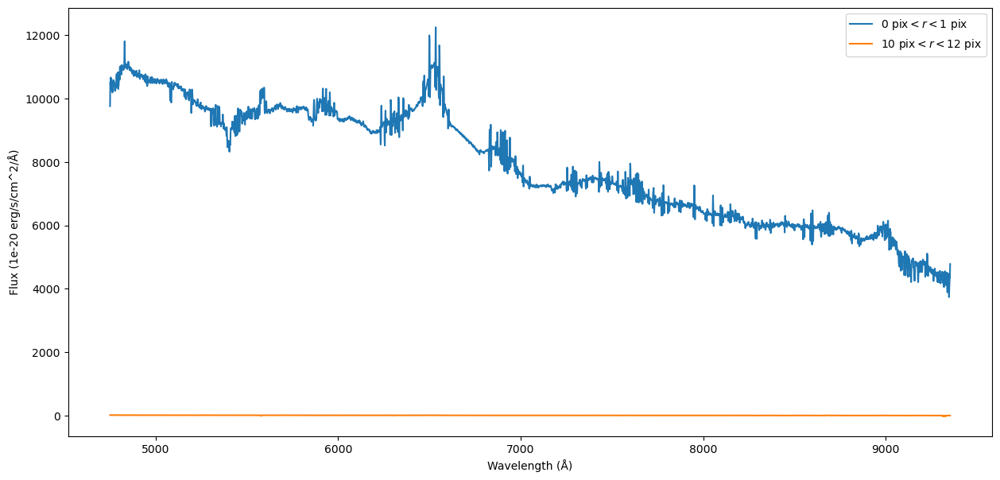

In [44]:
fig, ax = plt.subplots(1, figsize=(15,7))

ax.plot(wav_arr, spec_master_1, label=str(r_1)+r' pix$< r <$'+str(r_2)+ ' pix')
ax.plot(wav_arr, spec_master_2, label=str(r_3)+r' pix$< r <$'+str(r_4)+ ' pix')

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux (1e-20 erg/s/cm^2/Å)')

ax.legend()

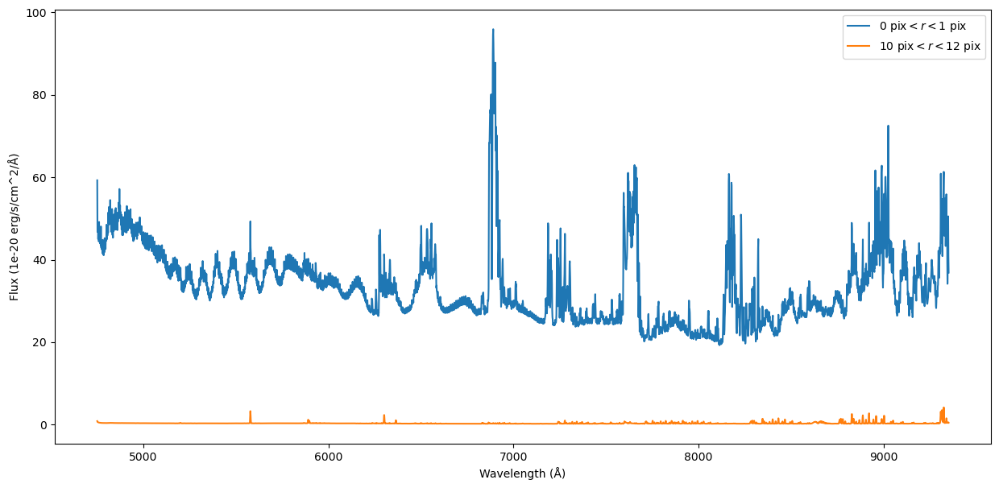

In [45]:
fig, ax = plt.subplots(1, figsize=(15,7))

ax.plot(wav_arr, err_master_1, label=str(r_1)+r' pix$< r <$'+str(r_2)+ ' pix')
ax.plot(wav_arr, err_master_2, label=str(r_3)+r' pix$< r <$'+str(r_4)+ ' pix')

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux (1e-20 erg/s/cm^2/Å)')

ax.legend()

Generate a range of annuli, generalize the above functions

In [46]:
def stack_spec_median(r_a, r_b):

    circ_x_a = [qso_ref_pix_x + r_a*np.cos(p) for p in np.linspace(0, 2*np.pi, 100)]
    circ_y_a = [qso_ref_pix_y + r_a*np.sin(p) for p in np.linspace(0, 2*np.pi, 100)]

    circ_x_b = [qso_ref_pix_x + r_b*np.cos(p) for p in np.linspace(0, 2*np.pi, 100)]
    circ_y_b = [qso_ref_pix_y + r_b*np.sin(p) for p in np.linspace(0, 2*np.pi, 100)]

    pixel_x_arr = []
    pixel_y_arr = []

    for i in range(spec_cube.shape[2]):
        for j in range(spec_cube.shape[1]):

            d = np.sqrt((i-qso_ref_pix_x)**2 + (j-qso_ref_pix_y)**2)

            if(d>=r_a and d<=r_b):
                pixel_x_arr.append(i)
                pixel_y_arr.append(j)
    
    spec_stack = np.zeros((len(pixel_x_arr), len(wav_arr)))
    var_stack = np.zeros((len(pixel_x_arr), len(wav_arr)))
    
    for i in range(len(pixel_x_arr)):

        x = pixel_x_arr[i]
        y = pixel_y_arr[i]

        spec_stack[i,:] = spec_cube[:, y, x]
        var_stack[i,:] = var_cube[:, y, x]
        
    spec_master = np.nanmean(spec_stack, axis=0)
    err_master = np.sqrt(np.nansum(var_stack, axis=0))/len(pixel_x_arr)
    
    return circ_x_a, circ_y_a, circ_x_b, circ_y_b, spec_master, err_master

In [47]:
r_lo = [0, 1, 2, 3, 5, 7]
r_hi = [1, 2, 3, 4, 6, 10]

In [48]:
circ_x_lo = []
circ_y_lo = []

circ_x_hi = []
circ_y_hi = []

spec_master_arr = []
err_master_arr = []

In [49]:
for i in range(len(r_lo)):
    
    r_a = r_lo[i]
    r_b = r_hi[i]
    circ_x_a, circ_y_a, circ_x_b, circ_y_b, spec_master, err_master = stack_spec_median(r_a, r_b)
    
    circ_x_lo.append(circ_x_a)
    circ_y_lo.append(circ_y_a)

    circ_x_hi.append(circ_x_b)
    circ_y_hi.append(circ_y_b)
    
    spec_master_arr.append(spec_master)
    err_master_arr.append(err_master)

In [50]:
colors_arr = ['red', 'yellow', 'green', 'blue', 'cyan', 'magenta']

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1359127286.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix],
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1359127286.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], fontsize=13)


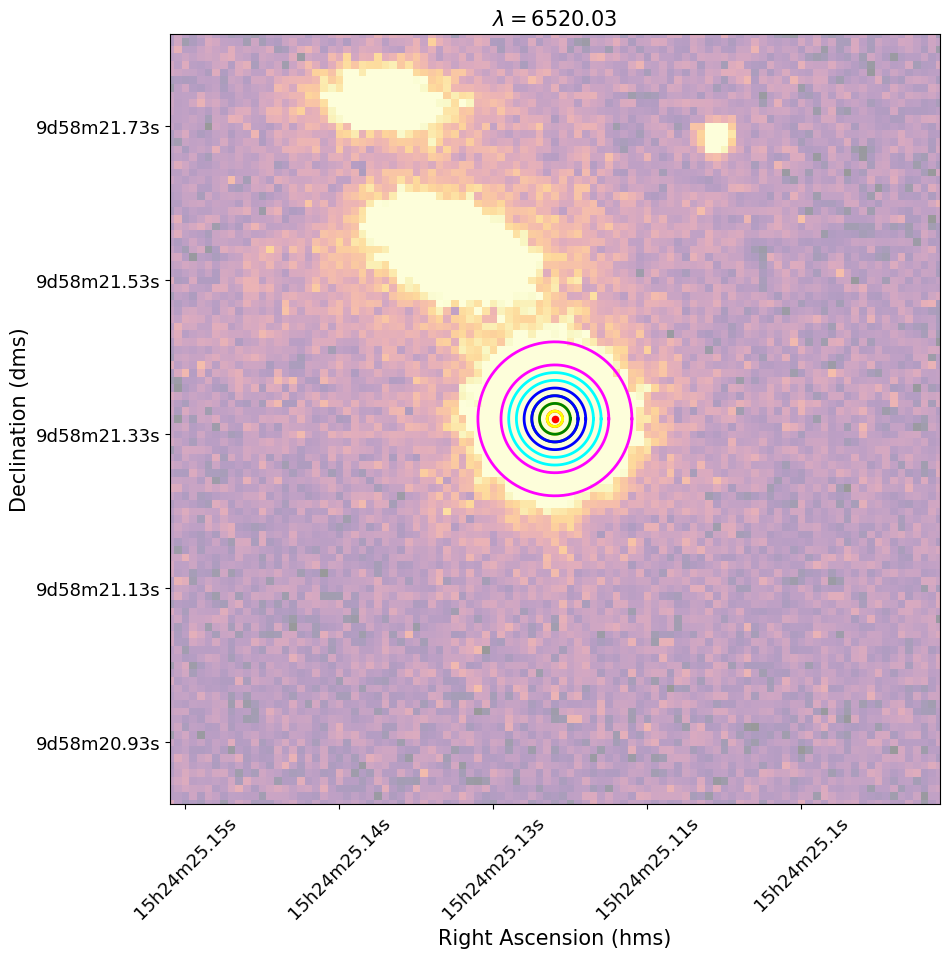

In [51]:
fig, ax = plt.subplots(1, figsize=(10,10))

qso_window_pix = 50

ax.imshow(spec_arr, vmin = min_flux, vmax = max_flux, cmap='inferno', alpha=.4)

ax.set_xlim(qso_ref_pix_x-qso_window_pix, qso_ref_pix_x+qso_window_pix)
ax.set_ylim(qso_ref_pix_y+qso_window_pix, qso_ref_pix_y-qso_window_pix)


for i in range(len(r_lo)):
    ax.plot(circ_x_lo[i], circ_y_lo[i], lw=2, color = colors_arr[i])
    ax.plot(circ_x_hi[i], circ_y_hi[i], lw=2, color = colors_arr[i])
    

ax.scatter(qso_ref_pix_x, qso_ref_pix_y, color='red', s= 20)

ax.set_title(r'$\lambda = $' + str(np.round(wav, 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], 
                   rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

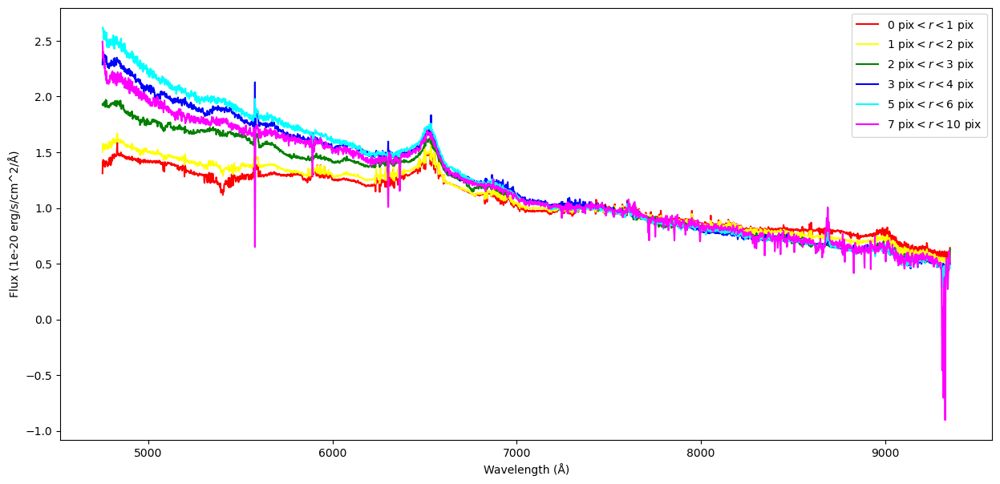

In [52]:
fig, ax = plt.subplots(1, figsize=(15,7))

for i in range(len(r_lo)):
    
    ax.plot(wav_arr, spec_master_arr[i]/spec_master_arr[i][2119], color=colors_arr[i],
            label=str(r_lo[i])+r' pix$< r <$'+str(r_hi[i])+ ' pix')

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux (1e-20 erg/s/cm^2/Å)')

ax.legend()

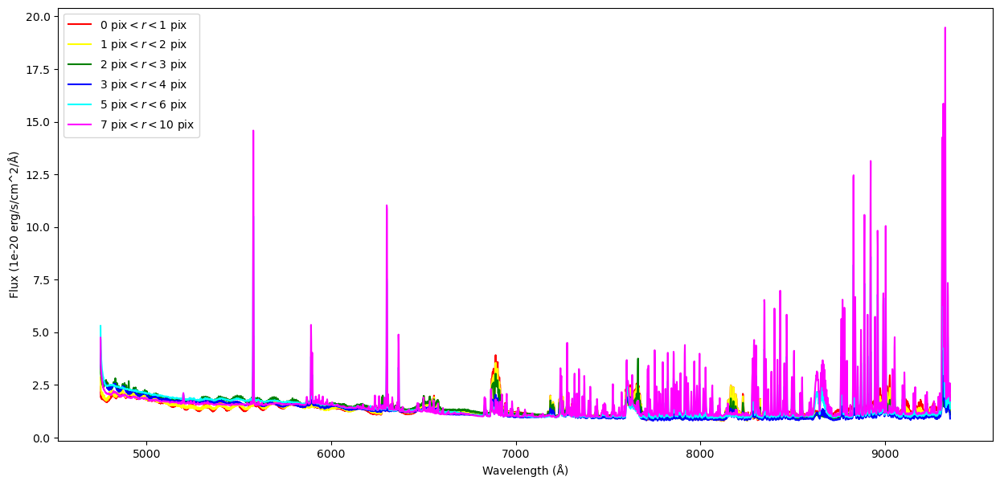

In [53]:
fig, ax = plt.subplots(1, figsize=(15,7))

for i in range(len(r_lo)):
    
    ax.plot(wav_arr, err_master_arr[i]/err_master_arr[i][2119], color=colors_arr[i],
            label=str(r_lo[i])+r' pix$< r <$'+str(r_hi[i])+ ' pix')

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux (1e-20 erg/s/cm^2/Å)')

ax.legend()

Choose template spectra

In [54]:
f_a = spec_master_arr[0]
f_b = spec_master_arr[4]

Text(0, 0.5, 'Flux (1e-20 erg/s/cm^2/Å)')

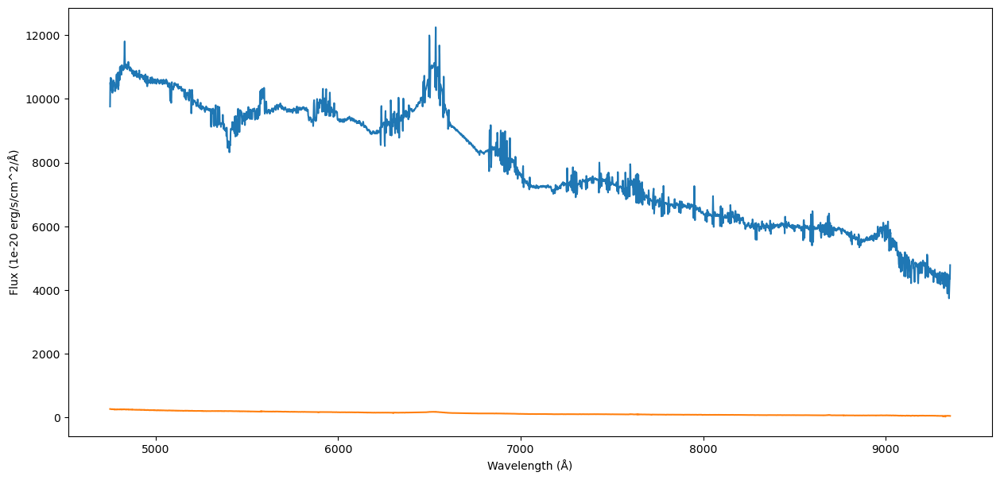

In [55]:
fig, ax = plt.subplots(1, figsize=(15,7))

ax.plot(wav_arr, f_a)
ax.plot(wav_arr, f_b)

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux (1e-20 erg/s/cm^2/Å)')

#ax.legend()

Obtain residuals for one of the spaxels

In [56]:
def best_model(f, f_err):
    
    alpha = np.nansum(f_a**2/f_err**2)
    beta = np.nansum(f_a*f_b/f_err**2)
    gamma = np.nansum(f_b**2/f_err**2)
    
    kappa = np.nansum(f*f_a/f_err**2)
    nu = np.nansum(f*f_b/f_err**2)
    
    a = (kappa*gamma-nu*beta)/(alpha*gamma-beta**2)
    b = (kappa*beta-alpha*nu)/(beta**2-alpha*gamma)
    
    return a, b

In [57]:
f = spec_cube[:,qso_ref_pix_y+2,qso_ref_pix_x-2]
f_err = np.sqrt(var_cube[:,qso_ref_pix_y+2,qso_ref_pix_x-2])

Below is the spaxel spectral profile

Text(0, 0.5, 'Flux (1e-20 erg/s/cm^2/Å)')

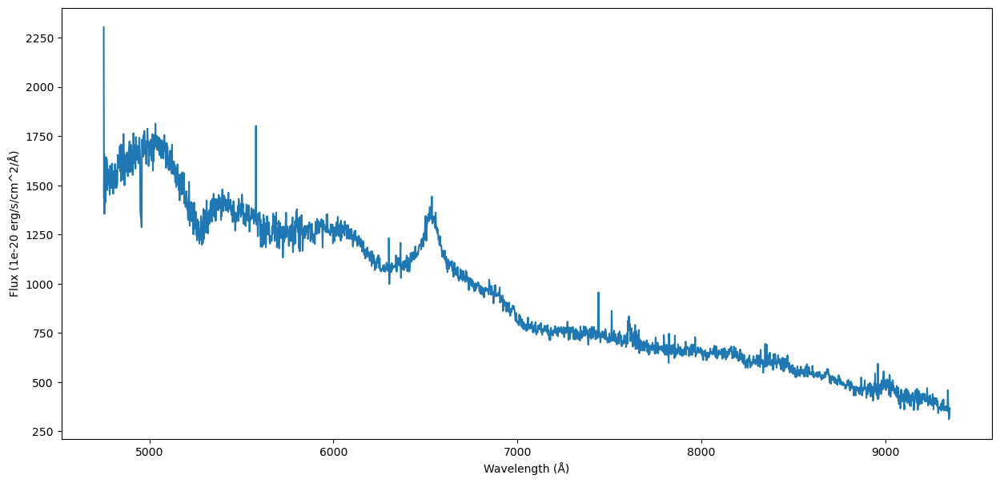

In [58]:
fig, ax = plt.subplots(1, figsize=(15,7))

ax.plot(wav_arr, f)

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux (1e-20 erg/s/cm^2/Å)')

#ax.legend()

In [59]:
a, b = best_model(f, f_err)

In [60]:
a, b

(0.02187634566905031, 6.049515520167794)

Below are the residuals after subtracting quasar light

Text(0, 0.5, 'Flux (1e-20 erg/s/cm^2/Å)')

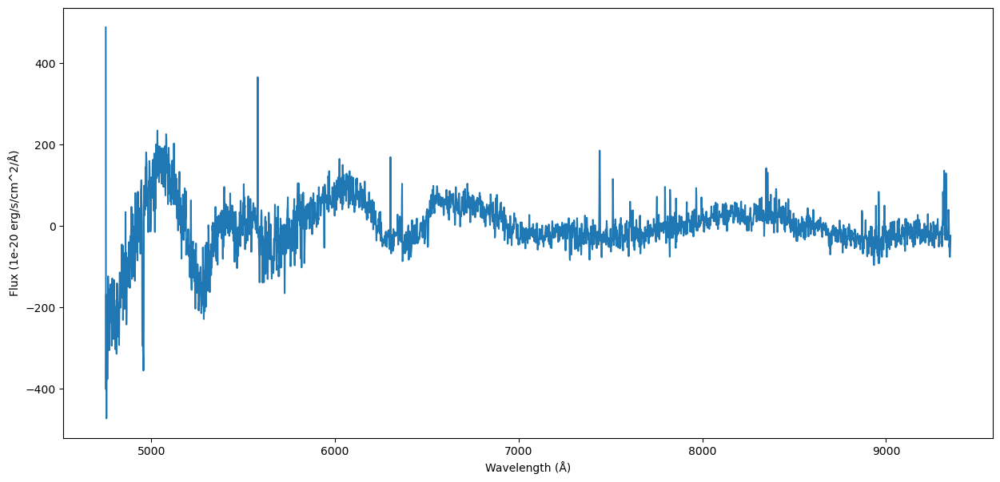

In [61]:
fig, ax = plt.subplots(1, figsize=(15,7))

ax.plot(wav_arr, f-(a*f_a+b*f_b))

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux (1e-20 erg/s/cm^2/Å)')

Now, let us extend this to aperture around the quasar. First isolate a window of radius 10 pixels.

In [62]:
r=15

In [63]:
disc_x_pix = []
disc_y_pix = []

for i in range(spec_cube.shape[2]):
    for j in range(spec_cube.shape[1]):

        d = np.sqrt((i-qso_ref_pix_x)**2 + (j-qso_ref_pix_y)**2)

        if(d<=r):
            disc_x_pix.append(i)
            disc_y_pix.append(j)

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1138774695.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix],
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1138774695.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], fontsize=13)


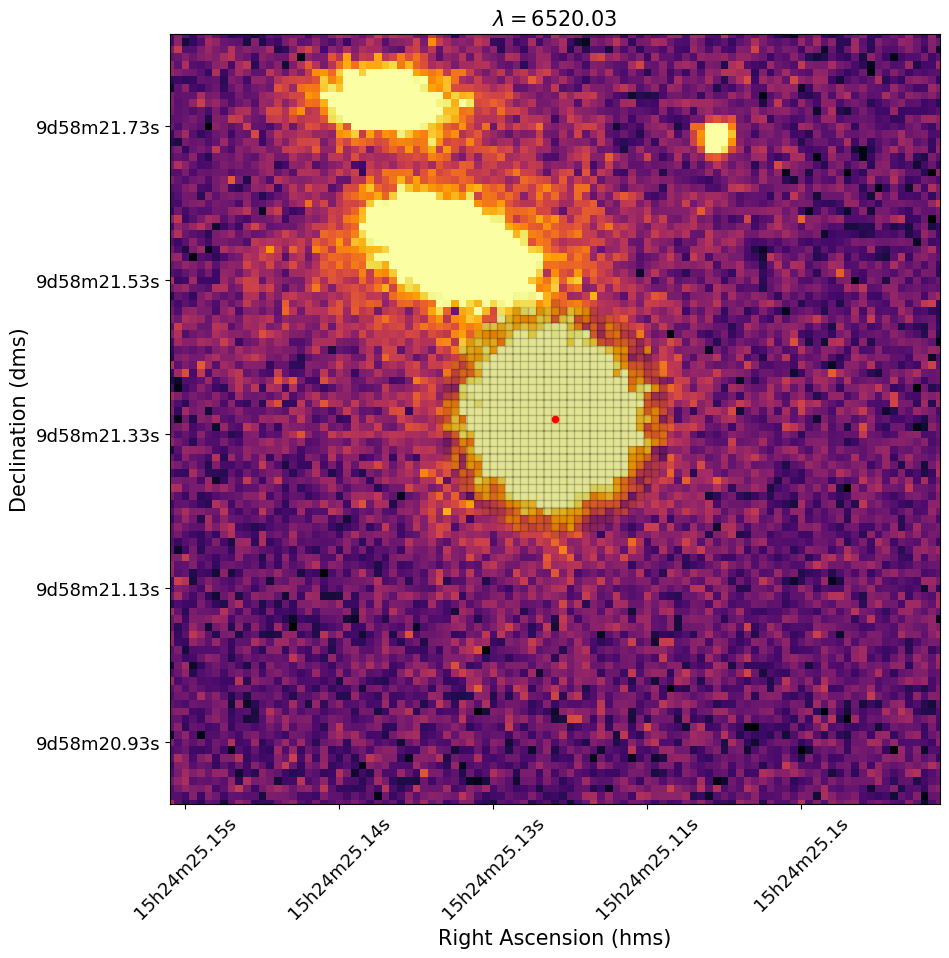

In [64]:
fig, ax = plt.subplots(1, figsize=(10,10))

qso_window_pix = 50

ax.imshow(spec_arr, vmin = min_flux, vmax = max_flux, cmap='inferno')
ax.scatter(disc_x_pix, disc_y_pix, marker='s', color='black', alpha=.1)

ax.scatter(qso_ref_pix_x, qso_ref_pix_y, color='red', s=20)

ax.set_title(r'$\lambda = $' + str(np.round(wav, 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], 
                   rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], fontsize=13)


ax.set_xlim(qso_ref_pix_x-qso_window_pix, qso_ref_pix_x+qso_window_pix)
ax.set_ylim(qso_ref_pix_y+qso_window_pix, qso_ref_pix_y-qso_window_pix)


ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

Now that we have our pixels, let us perform quasar light subtraction on each of them

In [65]:
a_disc = []
b_disc = []

In [66]:
for i in range(len(disc_x_pix)):
    
    x = disc_x_pix[i]
    y = disc_y_pix[i]
    
    f = spec_cube[:,y,x]
    f_err = np.sqrt(var_cube[:,y,x])
    
    a, b = best_model(f, f_err)
    
    a_disc.append(a)
    b_disc.append(b)

Copy over the older datacube, produce the QSO light subtracted datacube

In [67]:
spec_cube_sub = data_hdu.data.copy()

In [68]:
for i in range(len(disc_x_pix)):
    
    x = disc_x_pix[i]
    y = disc_y_pix[i]
    
    spec_cube_sub[:,y,x] -= (a_disc[i]*f_a + b_disc[i]*f_b)

In [69]:
n=2000

In [70]:
spec_arr_sub = spec_cube_sub[n, :, :]

In [71]:
spec_arr_sub_flat = spec_arr_sub.flatten()
min_flux_sub = np.nanpercentile(spec_arr_sub_flat, 1)
max_flux_sub = np.nanpercentile(spec_arr_sub_flat, 99)

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/2519727979.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/2519727979.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels, fontsize=13)


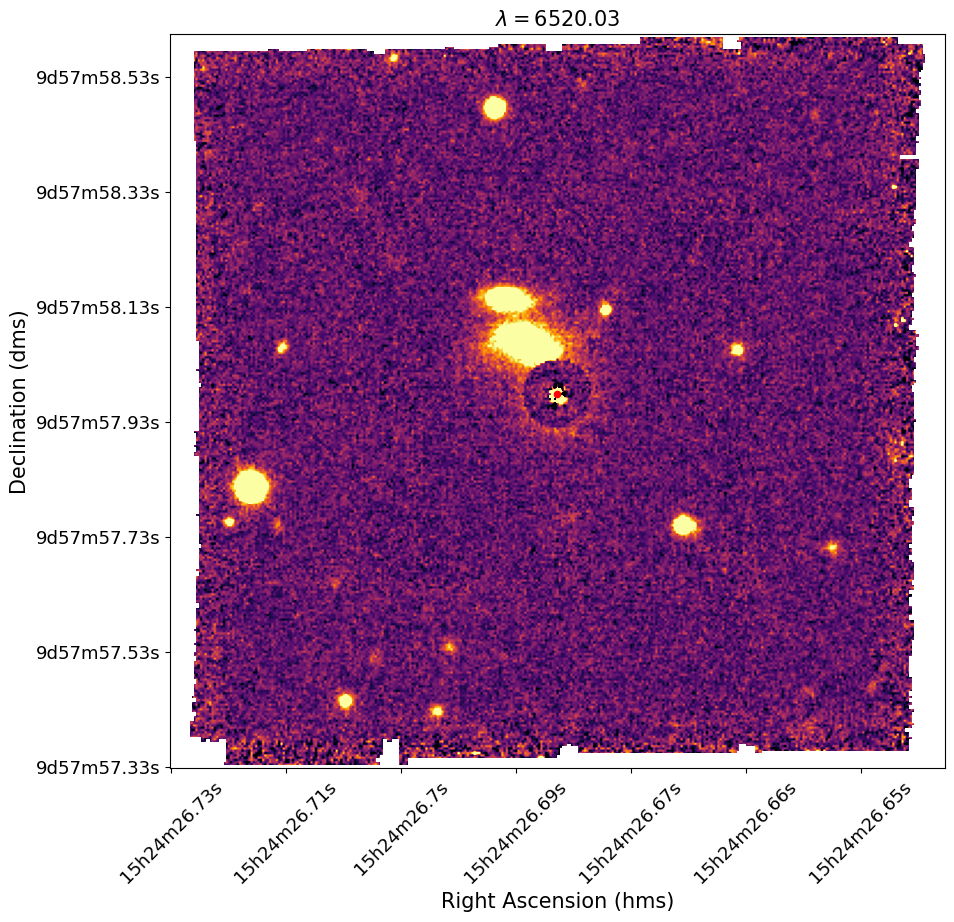

In [72]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.imshow(spec_arr_sub, vmin = min_flux_sub, vmax = max_flux_sub, cmap='inferno')

ax.scatter(qso_ref_pix_x, qso_ref_pix_y, color='red', s= 20)

ax.set_title(r'$\lambda = $' + str(np.round(wav, 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels, fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/3376587497.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix],
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/3376587497.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], fontsize=13)


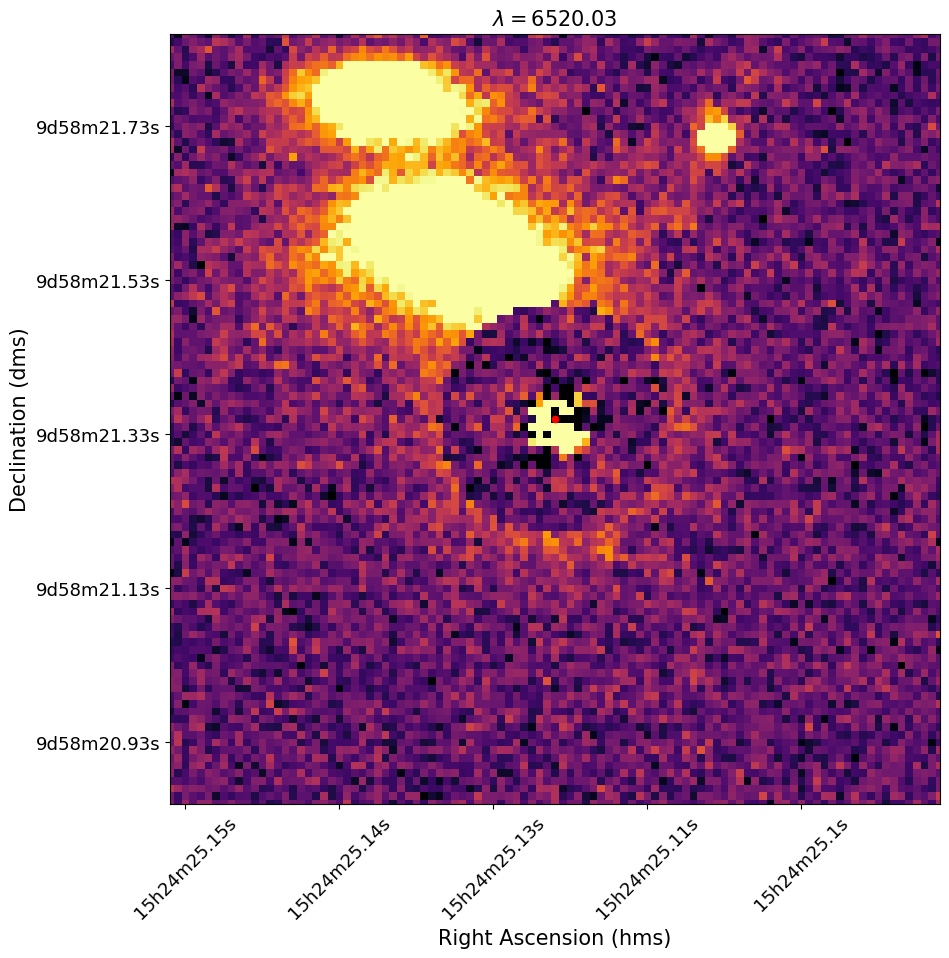

In [73]:
fig, ax = plt.subplots(1, figsize=(10,10))

qso_window_pix = 50

ax.imshow(spec_arr_sub, vmin = min_flux_sub, vmax = max_flux_sub, cmap='inferno')

ax.scatter(qso_ref_pix_x, qso_ref_pix_y, color='red', s=20)

ax.set_title(r'$\lambda = $' + str(np.round(wav, 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], 
                   rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], fontsize=13)


ax.set_xlim(qso_ref_pix_x-qso_window_pix, qso_ref_pix_x+qso_window_pix)
ax.set_ylim(qso_ref_pix_y+qso_window_pix, qso_ref_pix_y-qso_window_pix)


ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

In [74]:
len(disc_x_pix), len(disc_y_pix), len(a_disc)

(709, 709, 709)

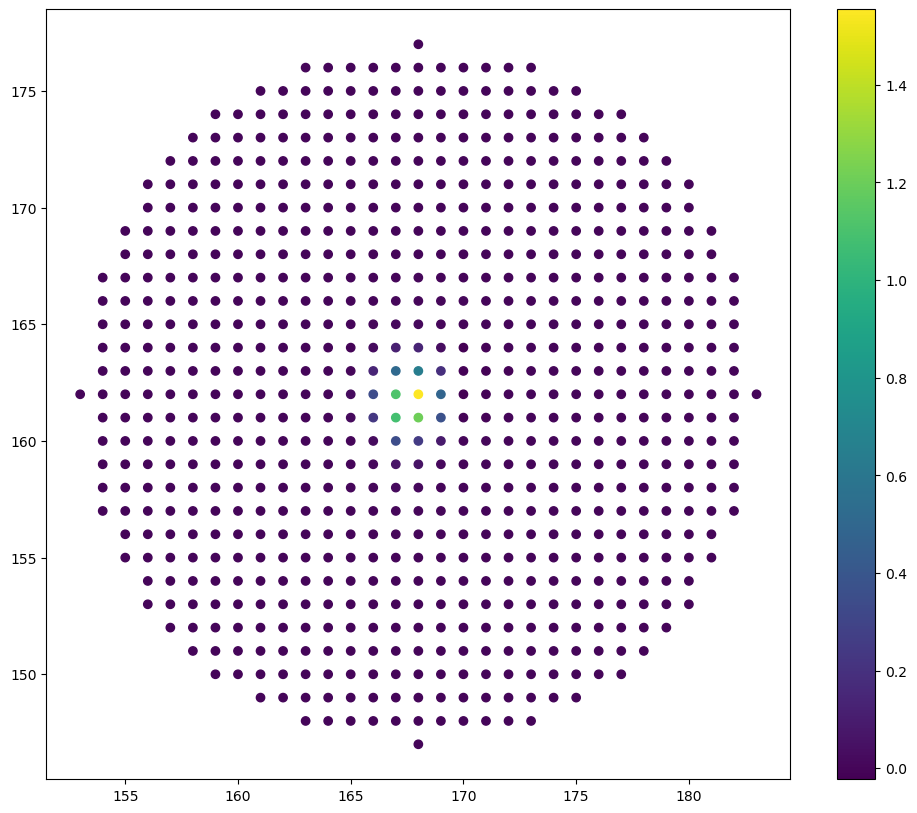

In [75]:
fig, ax = plt.subplots(1, figsize = (12,10))

sc = ax.scatter(disc_x_pix, disc_y_pix, c = a_disc)
plt.colorbar(sc)

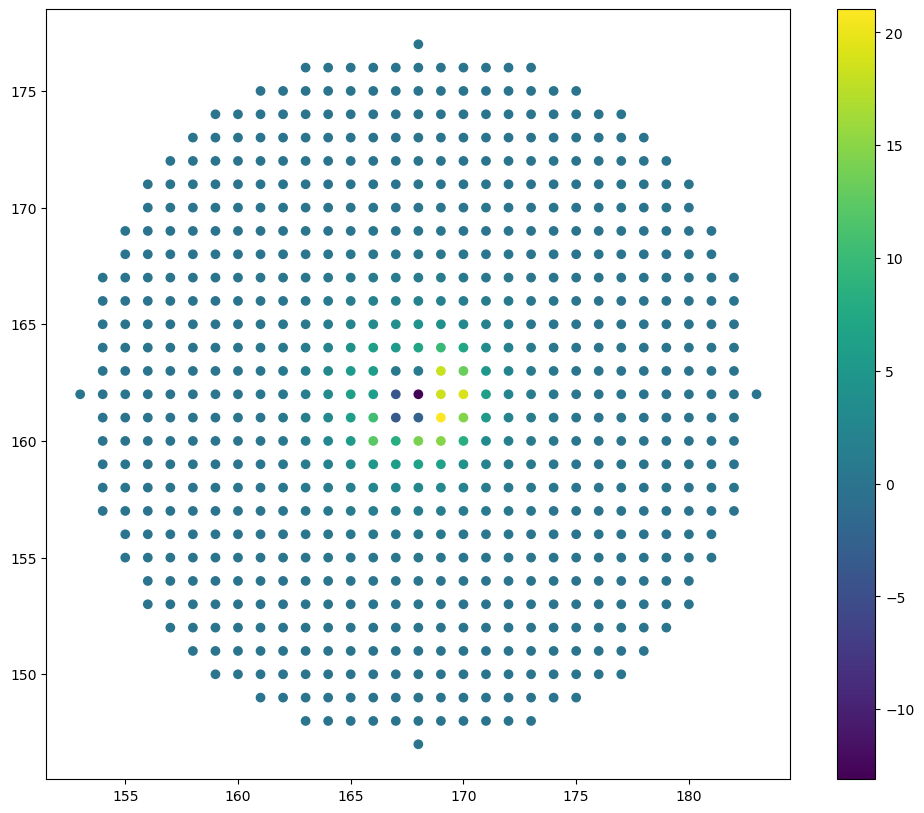

In [76]:
fig, ax = plt.subplots(1, figsize = (12,10))

sc = ax.scatter(disc_x_pix, disc_y_pix, c = b_disc)
plt.colorbar(sc)

In [77]:
wav_slice_idx = np.arange(0, len(wav_arr), 500)
wav_slice = wav_arr[wav_slice_idx]

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1616615323.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix],
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1616615323.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], fontsize=13)


Text(0, 0.5, 'Declination (dms)')

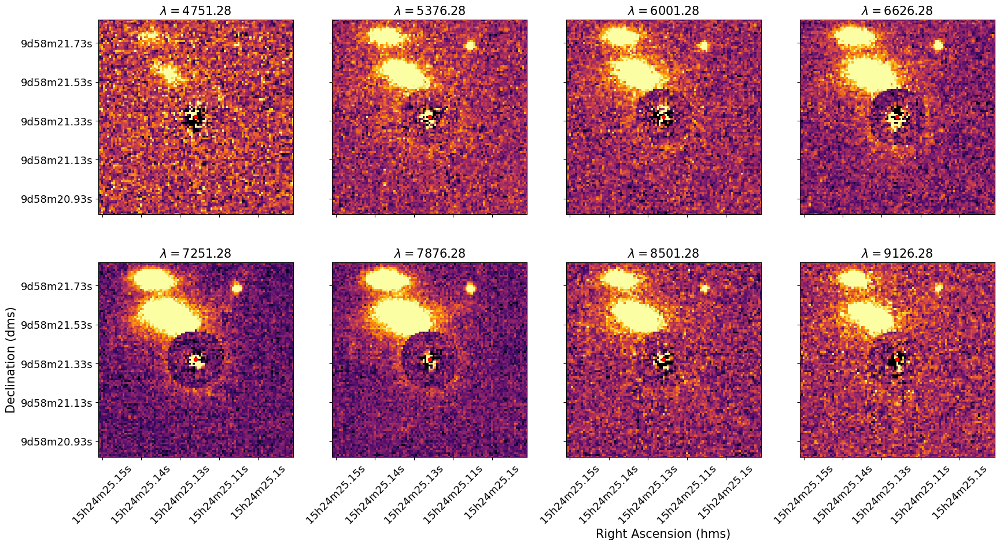

In [78]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10), sharex = True, sharey=True)

for i in range(len(wav_slice)):
    wav_idx = wav_slice_idx[i]
    wav = wav_slice[i]
    ax = axes[i//4][i%4]
    
    qso_window_pix = 50
    
    spec_arr_sub = spec_cube_sub[wav_idx,:,:]
    
    spec_arr_sub_flat = spec_arr_sub.flatten()
    min_flux_sub = np.nanpercentile(spec_arr_sub_flat, 1)
    max_flux_sub = np.nanpercentile(spec_arr_sub_flat, 99)

    ax.imshow(spec_arr_sub, vmin = min_flux_sub, vmax = max_flux_sub, cmap='inferno')

    ax.scatter(qso_ref_pix_x, qso_ref_pix_y, color='red', s=20)

    ax.set_title(r'$\lambda = $' + str(np.round(wav, 2)), fontsize=15)
    ax.set_xticklabels(RA_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], 
                       rotation=45, fontsize=13)
    ax.set_yticklabels(Dec_arr_labels[qso_ref_pix_x-qso_window_pix:qso_ref_pix_x+qso_window_pix], fontsize=13)


    ax.set_xlim(qso_ref_pix_x-qso_window_pix, qso_ref_pix_x+qso_window_pix)
    ax.set_ylim(qso_ref_pix_y+qso_window_pix, qso_ref_pix_y-qso_window_pix)

    ax.invert_yaxis()
    
axes[1,2].set_xlabel('Right Ascension (hms)', fontsize=15, position=(0,1))
axes[1,0].set_ylabel('Declination (dms)', fontsize=15, position=(0,1))

Compute standard deviation in residual flux in a pre-defined aperture. First do this exercise at $z=0.7$

In [79]:
wav_idx = np.argmin(np.abs(wav_arr-3727*(1+0.7)))

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1659415600.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1659415600.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels, fontsize=13)


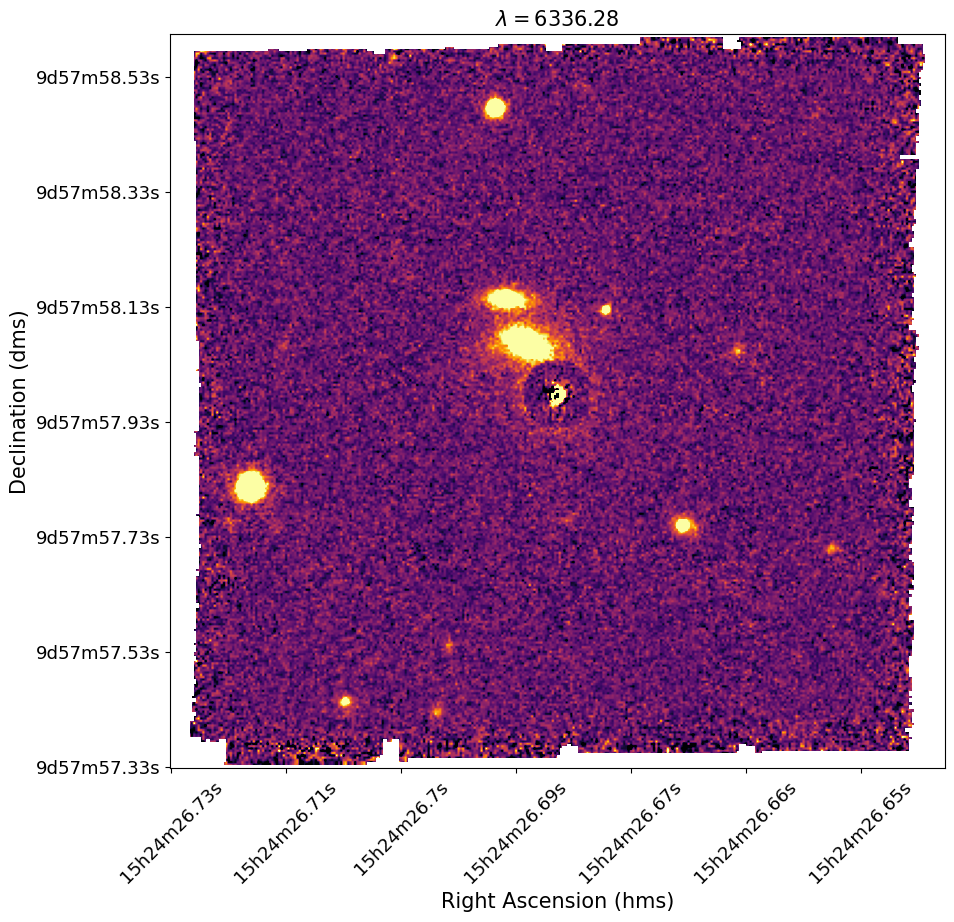

In [80]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.imshow(spec_cube_sub[wav_idx,:,:], cmap='inferno',
         vmin = -5.5, vmax = 13.5)

#ax.plot(circ_x_1, circ_y_1, color='gray', lw=2)
#ax.plot(circ_x_2, circ_y_2, color='gray', lw=2)

#ax.scatter(qso_ref_pix_x, qso_ref_pix_y, s=20)
#ax.scatter(qso_x, qso_y, color='white', marker='s',alpha=.05)

ax.set_title(r'$\lambda = $' + str(np.round(wav_arr[wav_idx], 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels, fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

Isolate pixels in annulus

In [81]:
r_1 = 0
r_2 = 2.5

In [82]:
pixel_x_arr = []
pixel_y_arr = []

for i in range(spec_cube.shape[2]):
    for j in range(spec_cube.shape[1]):
        
        dx = i-qso_ref_pix_x
        dy = j-qso_ref_pix_y
        
        #d = np.sqrt((i-qso_ref_pix_x)**2 + (j-qso_ref_pix_y)**2)
        
        if np.abs(dx)<=2 and np.abs(dy)<=2: #if(d>=r_1 and d<=r_2):
            pixel_x_arr.append(i)
            pixel_y_arr.append(j)

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/4077994815.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/4077994815.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels, fontsize=13)


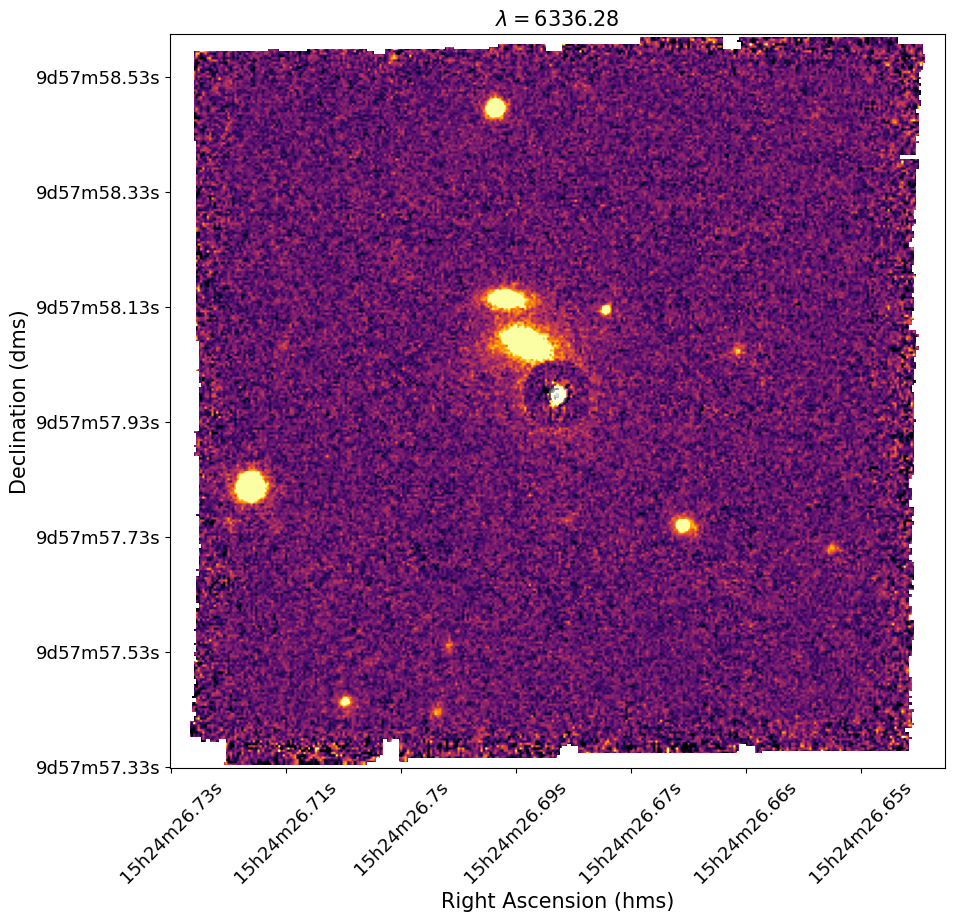

In [83]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.imshow(spec_cube_sub[wav_idx,:,:], cmap='inferno',
         vmin = -5.5, vmax = 13.5)

for i in range(len(pixel_x_arr)):
    ax.scatter(pixel_x_arr[i], pixel_y_arr[i], alpha=.1, color='white')

#ax.plot(circ_x_1, circ_y_1, color='gray', lw=2)
#ax.plot(circ_x_2, circ_y_2, color='gray', lw=2)

#ax.scatter(qso_ref_pix_x, qso_ref_pix_y, s=20)
#ax.scatter(qso_x, qso_y, color='white', marker='s',alpha=.05)

ax.set_title(r'$\lambda = $' + str(np.round(wav_arr[wav_idx], 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels, fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

Compute standard deviation of fluxes in annulus

In [84]:
spec_stack = []

for i in range(len(pixel_x_arr)):
    spec_stack.append(spec_cube_sub[:,pixel_y_arr[i],pixel_x_arr[i]])
    
spec_stack = np.array(spec_stack)

In [85]:
wav_arr[wav_idx]

6336.284541786687

In [86]:
#plt.hist(wav_arr[1:]-wav_arr[:-1])

Text(0, 0.5, 'Flux density (erg/cm2/s/Å)')

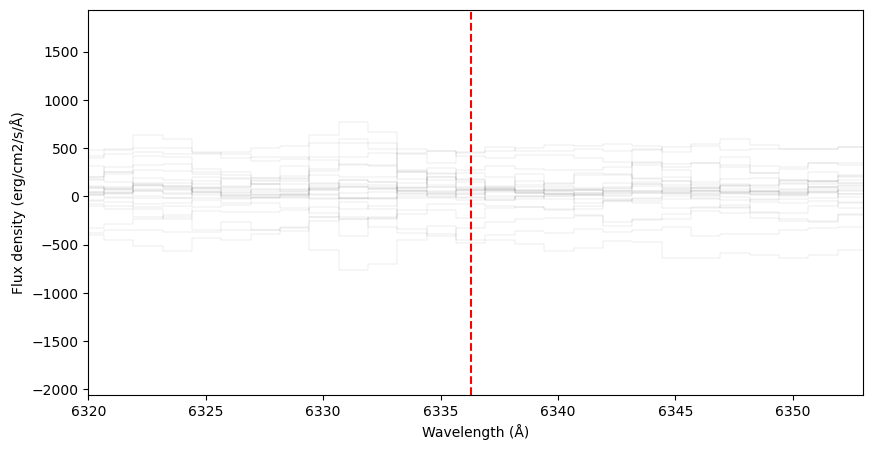

In [87]:
fig, ax = plt.subplots(1, figsize=(10,5))

for i in range(len(spec_stack)):
    ax.step(wav_arr, spec_stack[i], lw=.1, color='black', where='mid', alpha=.5)
    
ax.axvline(wav_arr[wav_idx], color='red', linestyle='--')
ax.set_xlim(6320, 6353)
#ax.set_ylim(-45,45)

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux density (erg/cm2/s/Å)')

In [88]:
flux_ring = np.zeros(len(pixel_x_arr))

for i in range(len(flux_ring)):
    flux_ring[i] = spec_cube_sub[wav_idx,pixel_y_arr[i],pixel_x_arr[i]]

(array([2., 1., 1., 0., 3., 8., 5., 2., 0., 3.]),
 array([-479.69512939, -385.57515564, -291.45518188, -197.33520813,
        -103.21523438,   -9.09526062,   85.02471313,  179.14468689,
         273.26466064,  367.3846344 ,  461.50460815]),
 <BarContainer object of 10 artists>)

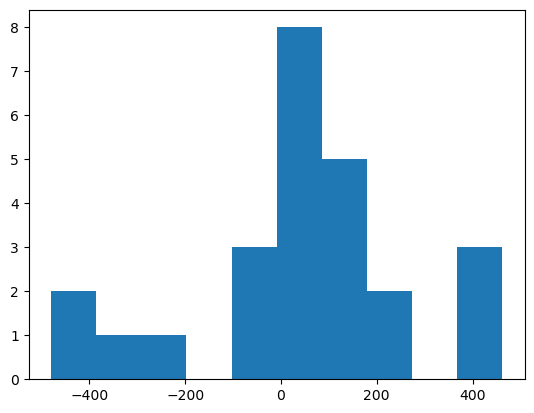

In [89]:
plt.hist(flux_ring)

In [90]:
np.median(flux_ring)-np.percentile(flux_ring, 16), np.percentile(flux_ring, 84)-np.median(flux_ring)

(166.13026641845704, 175.15961029052735)

Text(0, 0.5, 'Flux density (1e-20 erg/s/cm2/Å)')

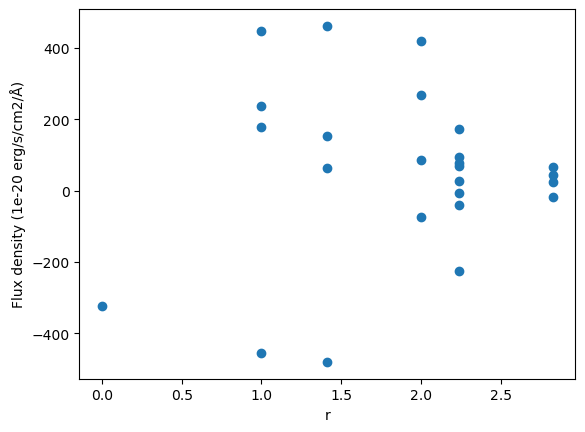

In [91]:
plt.scatter(np.sqrt((np.array(pixel_x_arr)-qso_ref_pix_x)**2+(np.array(pixel_y_arr)-qso_ref_pix_y)**2), 
            flux_ring)

plt.xlabel('r')
plt.ylabel('Flux density (1e-20 erg/s/cm2/Å)')

In [92]:
np.std(flux_ring)

234.58095129116805

In [93]:
sig_flux = np.std(flux_ring)*1e-20 # In erg/cm^2/Å/s

In [94]:
flux_lim = 3*sig_flux*5*(100/3e5)*3729*(1+0.7) # Account for area, wavelength pixel
# Units are erg/cm^2/s now, 3-sigma limit

In [95]:
lum_lim = 4*np.pi*(1.314344e+28)**2*flux_lim # Convert to luminosity using D_L

In [96]:
lum_lim # In erg/s

1.6141058446024511e+41

In [97]:
#SFR
1.4*1e-41*lum_lim, 6.58*1e-42*lum_lim, 6.58*1e-42*3.11*1e-20*lum_lim**1.495

(2.259748182443431, 1.0620816457484128, 8.257424998186005)

Repeat exercise at $z=1$

In [98]:
wav_idx = np.argmin(np.abs(wav_arr-3727*(1+1)))

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1659415600.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/1659415600.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels, fontsize=13)


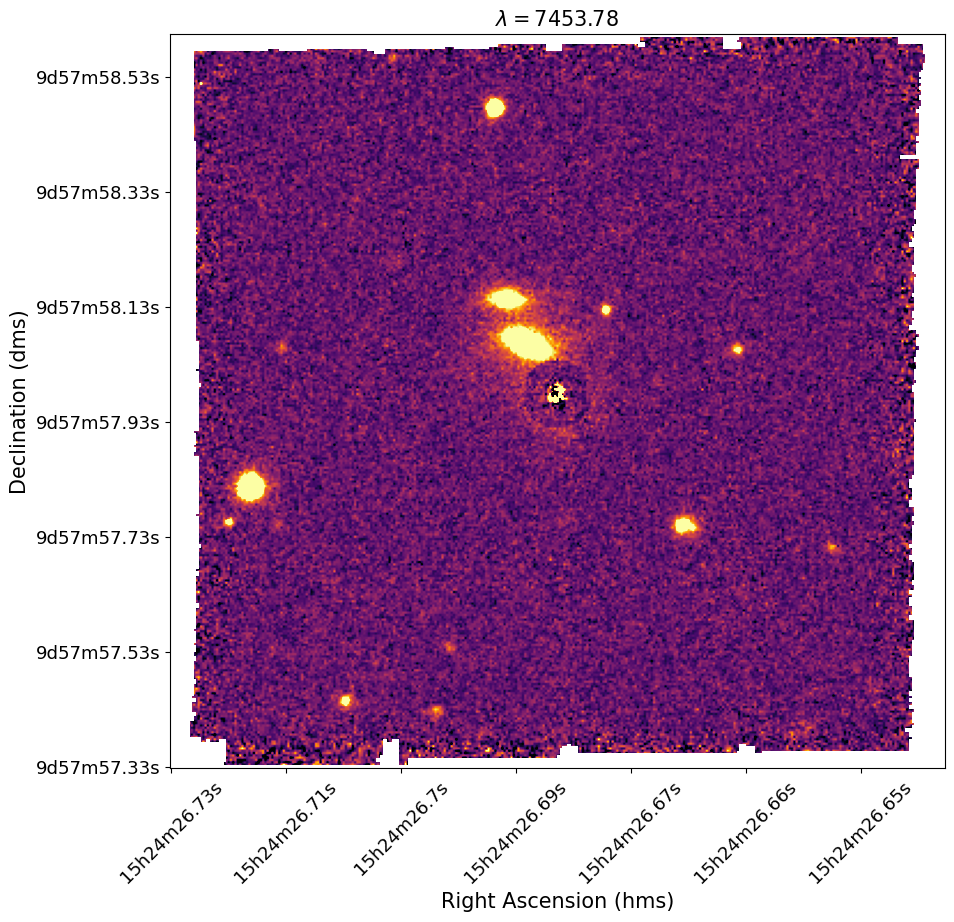

In [99]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.imshow(spec_cube_sub[wav_idx,:,:], cmap='inferno',
         vmin = -5.5, vmax = 13.5)

#ax.plot(circ_x_1, circ_y_1, color='gray', lw=2)
#ax.plot(circ_x_2, circ_y_2, color='gray', lw=2)

#ax.scatter(qso_ref_pix_x, qso_ref_pix_y, s=20)
#ax.scatter(qso_x, qso_y, color='white', marker='s',alpha=.05)

ax.set_title(r'$\lambda = $' + str(np.round(wav_arr[wav_idx], 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels, fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

Isolate pixels in annulus

In [100]:
#r_1 = 0
#r_2 = 2.5

In [101]:
pixel_x_arr = []
pixel_y_arr = []

for i in range(spec_cube.shape[2]):
    for j in range(spec_cube.shape[1]):
        
        dx = i-qso_ref_pix_x
        dy = j-qso_ref_pix_y
        
        #d = np.sqrt((i-qso_ref_pix_x)**2 + (j-qso_ref_pix_y)**2)
        
        if np.abs(dx)<=2 and np.abs(dy)<=2: #if(d>=r_1 and d<=r_2):
            pixel_x_arr.append(i)
            pixel_y_arr.append(j)

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/2533159726.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_51774/2533159726.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels, fontsize=13)


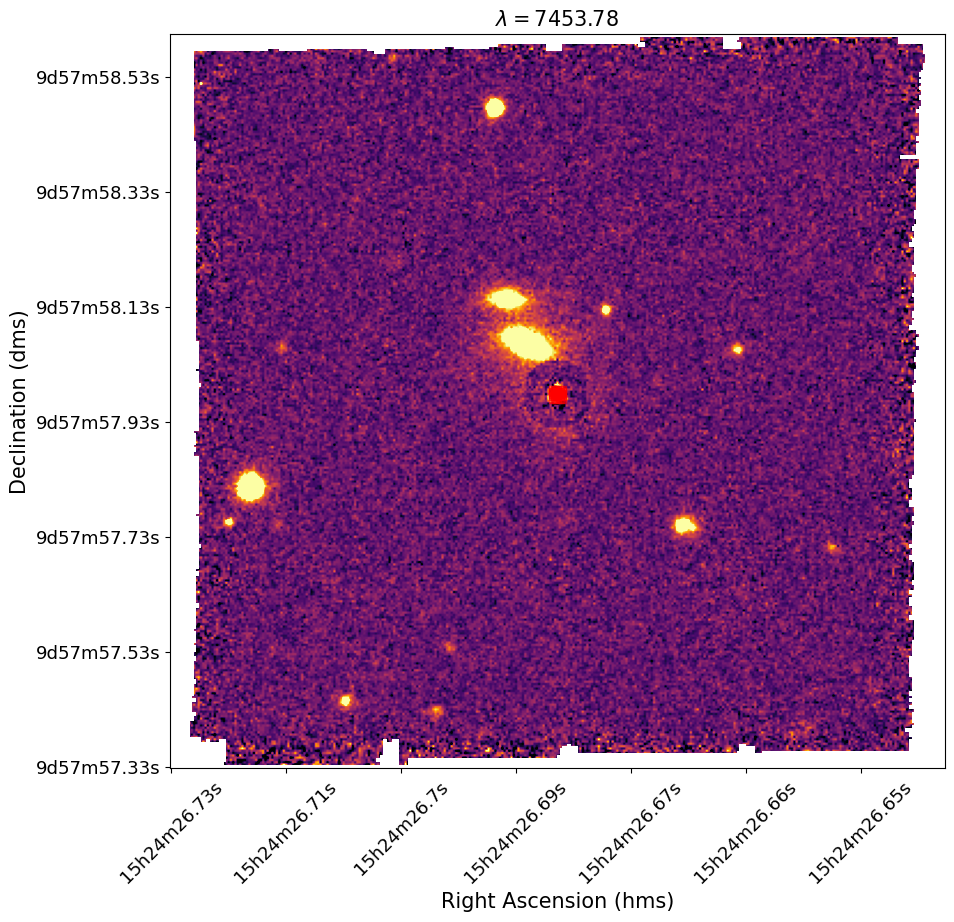

In [102]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.imshow(spec_cube_sub[wav_idx,:,:], cmap='inferno',
         vmin = -5.5, vmax = 13.5)

for i in range(len(pixel_x_arr)):
    ax.scatter(pixel_x_arr[i], pixel_y_arr[i], alpha=.5, color='red', marker='s')

#ax.plot(circ_x_1, circ_y_1, color='gray', lw=2)
#ax.plot(circ_x_2, circ_y_2, color='gray', lw=2)

#ax.scatter(qso_ref_pix_x, qso_ref_pix_y, s=20)
#ax.scatter(qso_x, qso_y, color='white', marker='s',alpha=.05)

ax.set_title(r'$\lambda = $' + str(np.round(wav_arr[wav_idx], 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels, fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

Compute standard deviation of fluxes in annulus

In [103]:
spec_stack = []

for i in range(len(pixel_x_arr)):
    spec_stack.append(spec_cube_sub[:,pixel_y_arr[i],pixel_x_arr[i]])
    
spec_stack = np.array(spec_stack)

In [104]:
wav_arr[wav_idx]

7453.784541786687

In [105]:
#plt.hist(wav_arr[1:]-wav_arr[:-1])

Text(0, 0.5, 'Flux density (erg/cm2/s/Å)')

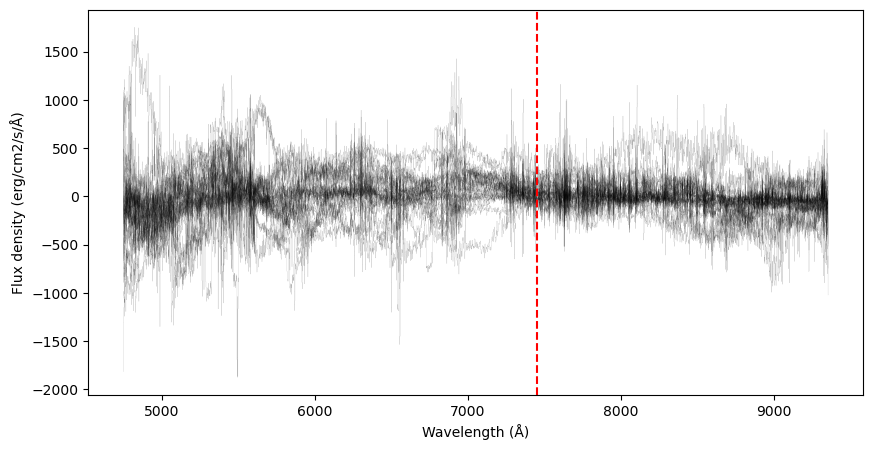

In [106]:
fig, ax = plt.subplots(1, figsize=(10,5))

for i in range(len(spec_stack)):
    ax.step(wav_arr, spec_stack[i], lw=.1, color='black', where='mid', alpha=.5)
    
ax.axvline(wav_arr[wav_idx], color='red', linestyle='--')
#ax.set_xlim(6320, 6353)
#ax.set_ylim(-45,45)

ax.set_xlabel('Wavelength (Å)')
ax.set_ylabel('Flux density (erg/cm2/s/Å)')

In [107]:
flux_ring = np.zeros(len(pixel_x_arr))

for i in range(len(flux_ring)):
    flux_ring[i] = spec_cube_sub[wav_idx,pixel_y_arr[i],pixel_x_arr[i]]

(array([3., 2., 5., 3., 4., 3., 1., 0., 3., 1.]),
 array([-98.68401337, -63.72616501, -28.76831665,   6.18953171,
         41.14738007,  76.10522842, 111.06307678, 146.02092514,
        180.9787735 , 215.93662186, 250.89447021]),
 <BarContainer object of 10 artists>)

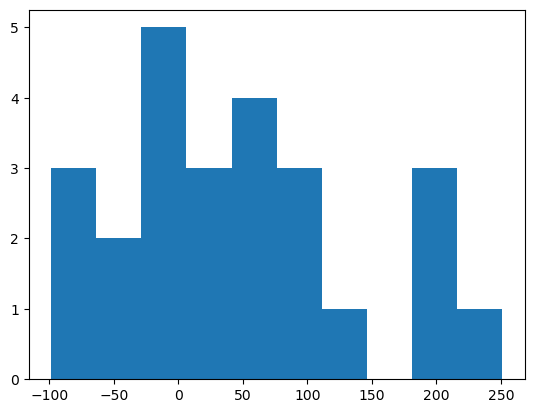

In [108]:
plt.hist(flux_ring)

In [109]:
np.median(flux_ring)-np.percentile(flux_ring, 16), np.percentile(flux_ring, 84)-np.median(flux_ring)

(81.69149383544922, 102.39872314453126)

Text(0, 0.5, 'Flux density (1e-20 erg/s/cm2/Å)')

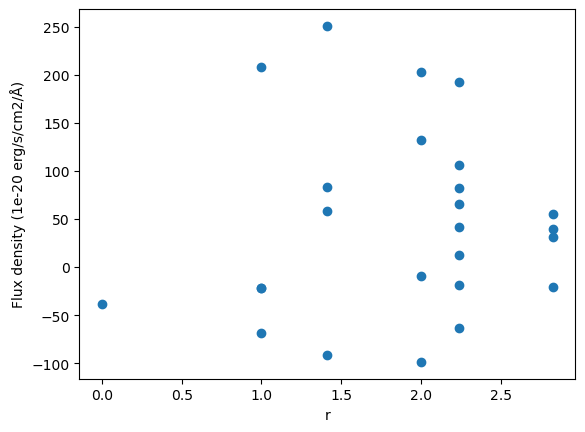

In [110]:
plt.scatter(np.sqrt((np.array(pixel_x_arr)-qso_ref_pix_x)**2+(np.array(pixel_y_arr)-qso_ref_pix_y)**2), 
            flux_ring)

plt.xlabel('r')
plt.ylabel('Flux density (1e-20 erg/s/cm2/Å)')

In [111]:
np.std(flux_ring)

94.42328523790722

In [112]:
sig_flux = np.std(flux_ring)*1e-20 # In erg/cm^2/Å/s

In [113]:
flux_lim = 3*sig_flux*5*(100/3e5)*3729*(1+1) # Account for area, wavelength pixel
# Units are erg/cm^2/s now, 3-sigma limit

In [115]:
flux_lim

3.52104430652156e-17

In [270]:
lum_lim = 4*np.pi*(2.038738e+28)**2*flux_lim # Convert to luminosity using D_L

In [271]:
lum_lim # In erg/s

1.839095109857504e+41

In [272]:
#SFR
1.4*1e-41*lum_lim, 6.58*1e-42*lum_lim, 6.58*1e-42*3.11*1e-20*lum_lim**1.495

(2.5747331538005054, 1.2101245822862376, 10.036205518805847)

Carve out aperture within quasar PSF 

In [141]:
qso_ref_pix_x = 168
qso_ref_pix_y = 162+7

In [142]:
spec_cube_sub.shape

(3682, 319, 337)

In [143]:
x = np.arange(spec_cube_sub.shape[1])
y = np.arange(spec_cube_sub.shape[2])

X,Y = np.meshgrid(x,y)

In [144]:
r_QSO = 3
qso_y, qso_x = np.where((X-qso_ref_pix_x)**2+(Y-qso_ref_pix_y)**2<r_QSO**2)

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_48724/2686484206.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_48724/2686484206.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(Dec_arr_labels, fontsize=13)


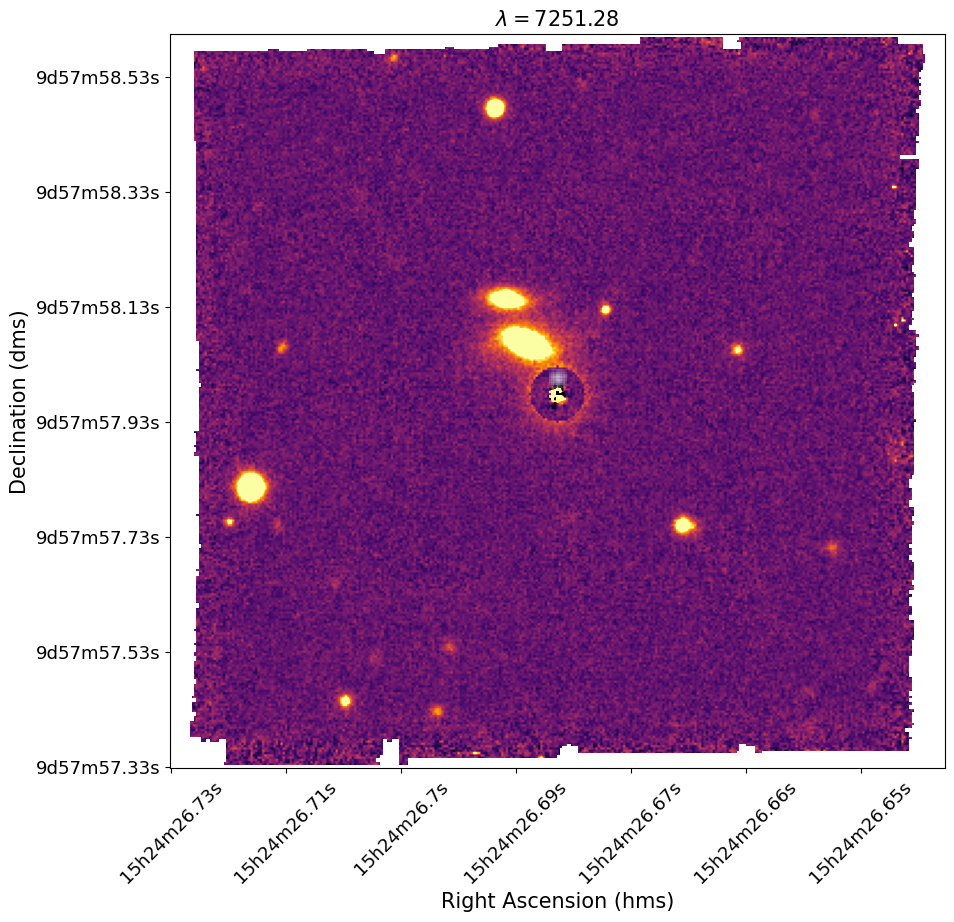

In [146]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.imshow(spec_cube_sub[n,:,:], cmap='inferno',
         vmin = -5.5, vmax = 13.5)

#ax.plot(circ_x_1, circ_y_1, color='gray', lw=2)
#ax.plot(circ_x_2, circ_y_2, color='gray', lw=2)

#ax.scatter(qso_ref_pix_x, qso_ref_pix_y, s=20)
ax.scatter(qso_x, qso_y, color='white', marker='s',alpha=.05)

ax.set_title(r'$\lambda = $' + str(np.round(wav_arr[n], 2)), fontsize=15)
ax.set_xticklabels(RA_arr_labels, rotation=45, fontsize=13)
ax.set_yticklabels(Dec_arr_labels, fontsize=13)

ax.set_xlabel('Right Ascension (hms)', fontsize=15)
ax.set_ylabel('Declination (dms)', fontsize=15)

ax.invert_yaxis()

In [147]:
spec_qso = np.zeros(len(wav_arr))
err_qso = np.zeros(len(wav_arr))

In [148]:
spec_stack = np.zeros((len(qso_x), len(wav_arr)))
var_stack = np.zeros((len(qso_x), len(wav_arr)))

for j in range(len(qso_x)):

    x = qso_x[j]
    y = qso_y[j]

    spec_stack[j,:] = spec_cube_sub[:,y,x]
    var_stack[j,:] = var_cube[:,y,x]

spec_qso = np.nansum(spec_stack, axis=0)
err_qso = np.sqrt(np.nansum(var_stack, axis=0)/len(qso_x))

In [149]:
3729.875*(1+1.04431), 3729.875*(1+1.16591), 3729.875*(1+1.25937)

(7625.020761250001, 8078.573561250001, 8427.16767875)

Text(0, 0.5, 'Flux')

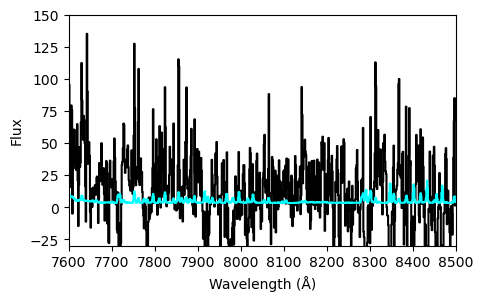

In [157]:
fig, ax = plt.subplots(1, figsize=(5,3))


ax.step(wav_arr, spec_qso, color='black', where='mid')
ax.step(wav_arr, err_qso, color='cyan', where='mid')

ax.set_xlim(7600,8500)
ax.set_ylim(-30,150)

ax.set_xlabel(r'Wavelength (Å)')
ax.set_ylabel(r'Flux')

In [158]:
np.savetxt(rootdir + 'qso_spec.dat',
          np.vstack((wav_arr, spec_qso, err_qso)).T, delimiter='\t')